#EEL891 - 2021.02 - Trabalho 2

##Regressao Multivariável - estimar o preço de um imóvel a partir de suas características

Matheus Lomba de Rezende Conde

DRE: 117085216

##Preparando o ambiente

###Importando as bibliotecas necessárias

In [175]:
#Bibliotecas de análise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.preprocessing import LabelBinarizer, MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor

from scipy.stats import pearsonr

import io #Leitura do csv importado

In [176]:
#Biblioteca para importação das bases de dados
from google.colab import files
uploaded = files.upload()

Saving conjunto_de_teste.csv to conjunto_de_teste (8).csv
Saving conjunto_de_treinamento.csv to conjunto_de_treinamento (8).csv
Saving exemplo_arquivo_respostas.csv to exemplo_arquivo_respostas (8).csv


###Carregando o dataset

In [177]:
#Carga do dataset de treinamento
df_treino = pd.read_csv(io.BytesIO(uploaded['conjunto_de_treinamento.csv']))

#Carga do dataset de teste
df_teste = pd.read_csv(io.BytesIO(uploaded['conjunto_de_teste.csv']))

#Carga do dataset com exemplos de resposta
df_exemplo = pd.read_csv(io.BytesIO(uploaded['exemplo_arquivo_respostas.csv']))

##Analisando o Dataset

###Número de Registros e Atributos nos datasets

In [178]:
print(f'Shape treino: {df_treino.shape}')
print(f'Shape teste: {df_teste.shape}')
print(f'Shape exemplo resposta: {df_exemplo.shape}')

Shape treino: (4683, 21)
Shape teste: (2000, 20)
Shape exemplo resposta: (2000, 2)


###Amostra do Dataset

In [179]:
df_treino.head().T

,0,1,2,3,4
Id,2000,2001,2002,2003,2004
tipo,Casa,Apartamento,Apartamento,Apartamento,Apartamento
bairro,Imbiribeira,Casa Amarela,Encruzilhada,Boa Viagem,Rosarinho
tipo_vendedor,Imobiliaria,Imobiliaria,Imobiliaria,Imobiliaria,Imobiliaria
quartos,3,4,3,4,2
suites,3,4,1,3,1
vagas,5,2,0,2,1
area_util,223,157,53,149,54
area_extra,167,0,0,0,0
diferenciais,piscina e copa,piscina e churrasqueira,nenhum,piscina e churrasqueira,piscina e churrasqueira


In [180]:
df_treino.columns

Index(['Id', 'tipo', 'bairro', 'tipo_vendedor', 'quartos', 'suites', 'vagas',
       'area_util', 'area_extra', 'diferenciais', 'churrasqueira',
       'estacionamento', 'piscina', 'playground', 'quadra', 's_festas',
       's_jogos', 's_ginastica', 'sauna', 'vista_mar', 'preco'],
      dtype='object')

In [181]:
df_treino.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,4683.0,4341.000000,1.352010e+03,2000.0,3170.5,4341.0,5511.5,6682.0
quartos,4683.0,3.043562,8.735901e-01,1.0,3.0,3.0,4.0,9.0
suites,4683.0,1.434337,1.102457e+00,0.0,1.0,1.0,2.0,6.0
vagas,4683.0,1.708093,1.210975e+00,0.0,1.0,2.0,2.0,30.0
area_util,4683.0,124.158018,1.073651e+02,21.0,68.0,96.0,149.0,2045.0
area_extra,4683.0,13.293188,2.668038e+02,0.0,0.0,0.0,0.0,17450.0
churrasqueira,4683.0,0.316891,4.653142e-01,0.0,0.0,0.0,1.0,1.0
estacionamento,4683.0,0.030750,1.726567e-01,0.0,0.0,0.0,0.0,1.0
piscina,4683.0,0.555627,4.969491e-01,0.0,0.0,1.0,1.0,1.0
playground,4683.0,0.157378,3.641954e-01,0.0,0.0,0.0,0.0,1.0


###Matriz de Correlação

In [182]:
#Seta o tamanho de plotagem
sns.set(rc={'figure.figsize':(150,150)})
sns.set_context(context='paper',font_scale=7)
#Plota a matriz de correlação
sns.heatmap(df_treino.loc[:, df_treino.columns != 'SalePrice'].corr(), annot = True, cmap='nipy_spectral', vmin=-1, vmax=1)

###Analisando atributos com valores vazios

[]

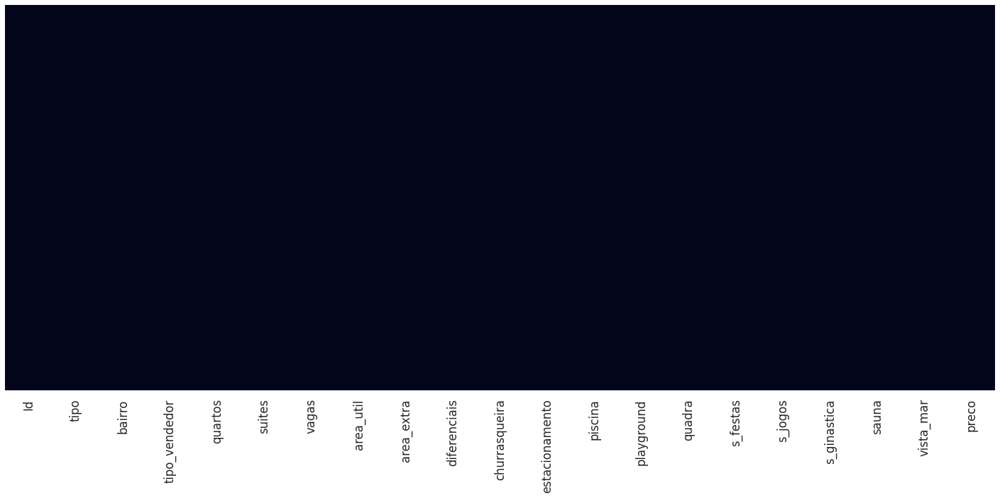

In [183]:
plt.figure(figsize=(25,10))
sns.set_context('talk')

hm = sns.heatmap(df_treino.isnull(),yticklabels=False,cbar=False)
hm.set_yticklabels(labels=hm.get_yticklabels(), va='center')

Apenas para confirmar que a base não possui nenhum valor vazio, calcularemos a porcentagem destes valores em cada coluna:

In [184]:
#Troca valores " " por Nulo
df_treino = df_treino.replace(" ", np.nan)

#Calcula o número de valores nulos ou " " em cada coluna
num_nulos = df_treino.isna().sum()
#Filtro - aparecer apenas colunas com nulos
num_nulos = num_nulos[num_nulos > 0]

#Calcula o percentual de nulos em cada coluna
num_linhas = df_treino.shape[0]
perc_nulos = num_nulos.apply(lambda x:(x/num_linhas)*100)
decrescente_perc_nulos = pd.Series(perc_nulos).sort_values(ascending=False)
decrescente_perc_nulos

Series([], dtype: int64)

###Variáveis Categóricas e Cardinalidade

In [185]:
df_treino.dtypes

Id                  int64
tipo               object
bairro             object
tipo_vendedor      object
quartos             int64
suites              int64
vagas               int64
area_util           int64
area_extra          int64
diferenciais       object
churrasqueira       int64
estacionamento      int64
piscina             int64
playground          int64
quadra              int64
s_festas            int64
s_jogos             int64
s_ginastica         int64
sauna               int64
vista_mar           int64
preco             float64
dtype: object

####Identificando Variáveis Categóricas:

In [186]:
variaveis_categoricas = [
  x for x in df_treino.columns if df_treino[x].dtypes=="object"
]
print(variaveis_categoricas)

['tipo', 'bairro', 'tipo_vendedor', 'diferenciais']


####Verificando a Cardinalidade das Variáveis Categóricas:

In [187]:
for v in variaveis_categoricas:
  print("\n%15s:"%v, "%4d categorias" % len(df_treino[v].unique()))
  print(df_treino[v].unique())


           tipo:    4 categorias
['Casa' 'Apartamento' 'Quitinete' 'Loft']

         bairro:   66 categorias
['Imbiribeira' 'Casa Amarela' 'Encruzilhada' 'Boa Viagem' 'Rosarinho'
 'Boa Vista' 'Espinheiro' 'Tamarineira' 'Gracas' 'Madalena' 'Parnamirim'
 'S Jose' 'Setubal' 'Arruda' 'Pina' 'Beira Rio' 'Caxanga' 'Casa Forte'
 'Prado' 'Iputinga' 'Campo Grande' 'Dois Irmaos' 'Torreao'
 'Ilha do Retiro' 'Areias' 'Varzea' 'Cordeiro' 'Torre' 'Santana' 'Barro'
 'Poco da Panela' 'Ipsep' 'Aflitos' 'Poco' 'Apipucos' 'Derby'
 'Cid Universitaria' 'Bongi' 'Jaqueira' 'Sto Amaro' 'Tejipio' 'Recife'
 'Monteiro' 'Macaxeira' 'Sancho' 'Afogados' 'San Martin' 'Cajueiro'
 'Hipodromo' 'Guabiraba' 'Engenho do Meio' 'Piedade' 'Jd S Paulo'
 'Lagoa do Araca' 'Ponto de Parada' 'Ilha do Leite' 'Estancia' 'Paissandu'
 'Zumbi' 'Agua Fria' 'Benfica' 'Soledade' 'Centro' 'Sto Antonio' 'Coelhos'
 'Cohab']

  tipo_vendedor:    2 categorias
['Imobiliaria' 'Pessoa Fisica']

   diferenciais:   83 categorias
['piscina e copa'

tipo --> não-ordinal com 4 categorias **-> one-hot encoding**

bairro --> não-ordinal com 66 categorias **-> será analisado abaixo**

tipo_vendedor --> binária **-> binarizar (mapear para 0 ou 1)**

diferenciais --> não-ordinal com 83 categorias **-> descartar**

####Analisando o Atributo "Bairro"

In [188]:
df_treino['bairro'].value_counts().plot(kind="bar")
plt.xticks(rotation=45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]),
 <a list of 66 Text major ticklabel objects>)

Através do gráfico acima, podemos verificar que a grande maioria dos imóveis presentes no dataset se encontram no bairro de Boa Viagem (com 1599 ocorrências).

Dessa forma, no tópico "Tratamento das Variáveis Categóricas", será realizado um tratamento em cima deste atributo de forma que os valores mais expressivos permaneçam na base através do one-hot encoding, enquanto que os menos expressivos serão apagados.

###Gráfico de Dispersão - Atributos VS Alvo

In [189]:
df_treino.columns

Index(['Id', 'tipo', 'bairro', 'tipo_vendedor', 'quartos', 'suites', 'vagas',
       'area_util', 'area_extra', 'diferenciais', 'churrasqueira',
       'estacionamento', 'piscina', 'playground', 'quadra', 's_festas',
       's_jogos', 's_ginastica', 'sauna', 'vista_mar', 'preco'],
      dtype='object')

####Gráficos de Dispersão usando todos os valores de "Preço"

Devido a alguns outliers, a leitura da maioria dos casos fica relativamente dificultada. Dessa forma, os gráficos foram plotados novamente, mas sem esses casos com preços muito altos (acima de R$ 8.000.000,00)

In [190]:
alvo = "preco"
for atr in df_treino.columns:
  if atr != alvo and atr!="Id":
    df_treino.plot.scatter(x=atr, y=alvo)
    plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


KeyboardInterrupt: ignored

####Gráficos de Dispersão - coluna preço abaixo de R$ 8.000.000,00 para melhorar a visualização

In [ ]:
alvo = "preco"
for atr in df_treino.columns:
  if atr != alvo and atr!="Id":
    df_treino.plot.scatter(x=atr, y=alvo)
    plt.ylim([0, 8000000])
    plt.show()

##Tratamento do Dataset de Treino

###Exclusão de atributos desnecessários

In [191]:
#Remoção baseada na cardinalidade das variáveis categóricas
del df_treino["diferenciais"]

###Tratamento do Atributo "Bairro"

In [192]:
df_treino = pd.get_dummies(df_treino, columns=["bairro"])
print(df_treino.head(3).T)

                          0            1            2
Id                     2000         2001         2002
tipo                   Casa  Apartamento  Apartamento
tipo_vendedor   Imobiliaria  Imobiliaria  Imobiliaria
quartos                   3            4            3
suites                    3            4            1
...                     ...          ...          ...
bairro_Tejipio            0            0            0
bairro_Torre              0            0            0
bairro_Torreao            0            0            0
bairro_Varzea             0            0            0
bairro_Zumbi              0            0            0

[85 rows x 3 columns]


In [193]:
for col in df_treino.columns:
  if col[:7] == "bairro_" and df_treino[col].sum() < 100:
    df_treino.drop([col], axis = 1, inplace=True)

In [194]:
df_treino.columns

Index(['Id', 'tipo', 'tipo_vendedor', 'quartos', 'suites', 'vagas',
       'area_util', 'area_extra', 'churrasqueira', 'estacionamento', 'piscina',
       'playground', 'quadra', 's_festas', 's_jogos', 's_ginastica', 'sauna',
       'vista_mar', 'preco', 'bairro_Boa Viagem', 'bairro_Casa Amarela',
       'bairro_Casa Forte', 'bairro_Encruzilhada', 'bairro_Espinheiro',
       'bairro_Gracas', 'bairro_Madalena', 'bairro_Parnamirim',
       'bairro_Rosarinho', 'bairro_Torre'],
      dtype='object')

###Tratamento das Variáveis Categóricas

In [195]:
#Printando as colunas até agora:
print(df_treino.head(3).T)

                               0            1            2
Id                          2000         2001         2002
tipo                        Casa  Apartamento  Apartamento
tipo_vendedor        Imobiliaria  Imobiliaria  Imobiliaria
quartos                        3            4            3
suites                         3            4            1
vagas                          5            2            0
area_util                    223          157           53
area_extra                   167            0            0
churrasqueira                  0            1            0
estacionamento                 0            0            0
piscina                        1            1            0
playground                     0            0            0
quadra                         0            0            0
s_festas                       0            0            0
s_jogos                        0            0            0
s_ginastica                    0            0           

In [196]:
#Aplicando one-hot encoding na variável "tipo":
#df_treino = pd.get_dummies(df_treino, columns=["tipo", "bairro"])
df_treino = pd.get_dummies(df_treino, columns=["tipo"])
print(df_treino.head(3).T)

                               0            1            2
Id                          2000         2001         2002
tipo_vendedor        Imobiliaria  Imobiliaria  Imobiliaria
quartos                        3            4            3
suites                         3            4            1
vagas                          5            2            0
area_util                    223          157           53
area_extra                   167            0            0
churrasqueira                  0            1            0
estacionamento                 0            0            0
piscina                        1            1            0
playground                     0            0            0
quadra                         0            0            0
s_festas                       0            0            0
s_jogos                        0            0            0
s_ginastica                    0            0            0
sauna                          0            0           

In [197]:
#Aplicando a binarização:
binarizador = LabelBinarizer()

for v in ["tipo_vendedor"]:
  df_treino[v] = binarizador.fit_transform(df_treino[v])

print(df_treino.head(3).T)

                             0         1         2
Id                      2000.0    2001.0    2002.0
tipo_vendedor              0.0       0.0       0.0
quartos                    3.0       4.0       3.0
suites                     3.0       4.0       1.0
vagas                      5.0       2.0       0.0
area_util                223.0     157.0      53.0
area_extra               167.0       0.0       0.0
churrasqueira              0.0       1.0       0.0
estacionamento             0.0       0.0       0.0
piscina                    1.0       1.0       0.0
playground                 0.0       0.0       0.0
quadra                     0.0       0.0       0.0
s_festas                   0.0       0.0       0.0
s_jogos                    0.0       0.0       0.0
s_ginastica                0.0       0.0       0.0
sauna                      0.0       0.0       0.0
vista_mar                  0.0       0.0       0.0
preco                1000000.0  680000.0  450000.0
bairro_Boa Viagem          0.0 

###Verificando o tipo de todas as colunas novamente

In [198]:
df_treino.dtypes

Id                       int64
tipo_vendedor            int64
quartos                  int64
suites                   int64
vagas                    int64
area_util                int64
area_extra               int64
churrasqueira            int64
estacionamento           int64
piscina                  int64
playground               int64
quadra                   int64
s_festas                 int64
s_jogos                  int64
s_ginastica              int64
sauna                    int64
vista_mar                int64
preco                  float64
bairro_Boa Viagem        uint8
bairro_Casa Amarela      uint8
bairro_Casa Forte        uint8
bairro_Encruzilhada      uint8
bairro_Espinheiro        uint8
bairro_Gracas            uint8
bairro_Madalena          uint8
bairro_Parnamirim        uint8
bairro_Rosarinho         uint8
bairro_Torre             uint8
tipo_Apartamento         uint8
tipo_Casa                uint8
tipo_Loft                uint8
tipo_Quitinete           uint8
dtype: o

##Análise Exploratória

###Verificando novamente o dataset

In [199]:
df_treino.head().T

,0,1,2,3,4
Id,2000.0,2001.0,2002.0,2003.0,2004.0
tipo_vendedor,0.0,0.0,0.0,0.0,0.0
quartos,3.0,4.0,3.0,4.0,2.0
suites,3.0,4.0,1.0,3.0,1.0
vagas,5.0,2.0,0.0,2.0,1.0
area_util,223.0,157.0,53.0,149.0,54.0
area_extra,167.0,0.0,0.0,0.0,0.0
churrasqueira,0.0,1.0,0.0,1.0,1.0
estacionamento,0.0,0.0,0.0,0.0,0.0
piscina,1.0,1.0,0.0,1.0,1.0


###Coeficiente de Pearson

Devido às variáveis categóricas existentes antes do tratamento do dataset, não foi possível calcular o coeficiente.

Dessa forma, agora iremos calcular o coeficiente e plotar novamente os diagramas de dispersão, de forma a analisar melhor a relação entre os Atributos e a Variável Alvo

In [200]:
alvo = "preco"
for atr in df_treino.columns:
  if atr != alvo and atr!="Id":
    df_treino.plot.scatter(x=atr, y=alvo)
    #plt.ylim([0, 8000000])
    plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


KeyboardInterrupt: ignored

In [ ]:
for atr in df_treino.columns:
  if atr != alvo and atr!="Id":
    print( "%s = %.3f" % ( atr, pearsonr(df_treino[atr], df_treino['preco'])[0] ) )

##Tratamento do Dataset de Teste

In [201]:
df_teste['bairro'].value_counts().plot(kind="bar")
plt.xticks(rotation=45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55]), <a list of 56 Text major ticklabel objects>)

In [202]:
del df_teste["diferenciais"]

df_teste = pd.get_dummies(df_teste, columns=["bairro"])
for col in df_teste.columns:
  if col[:7] == "bairro_" and df_teste[col].sum() < 30:
    df_teste.drop([col], axis = 1, inplace=True)

df_teste = pd.get_dummies(df_teste, columns=["tipo"])

binarizador = LabelBinarizer()
for v in ["tipo_vendedor"]:
  df_teste[v] = binarizador.fit_transform(df_teste[v])

In [203]:
df_teste.columns

Index(['Id', 'tipo_vendedor', 'quartos', 'suites', 'vagas', 'area_util',
       'area_extra', 'churrasqueira', 'estacionamento', 'piscina',
       'playground', 'quadra', 's_festas', 's_jogos', 's_ginastica', 'sauna',
       'vista_mar', 'bairro_Aflitos', 'bairro_Boa Viagem', 'bairro_Boa Vista',
       'bairro_Casa Amarela', 'bairro_Casa Forte', 'bairro_Cordeiro',
       'bairro_Encruzilhada', 'bairro_Espinheiro', 'bairro_Gracas',
       'bairro_Iputinga', 'bairro_Jaqueira', 'bairro_Madalena',
       'bairro_Parnamirim', 'bairro_Pina', 'bairro_Rosarinho',
       'bairro_Setubal', 'bairro_Tamarineira', 'bairro_Torre',
       'tipo_Apartamento', 'tipo_Casa', 'tipo_Loft'],
      dtype='object')

In [204]:
df_teste.head().T

,0,1,2,3,4
Id,0,1,2,3,4
tipo_vendedor,0,0,0,0,0
quartos,4,2,3,3,3
suites,4,0,1,0,1
vagas,3,1,2,1,1
area_util,182,85,115,92,65
area_extra,0,0,20,0,0
churrasqueira,0,0,1,0,0
estacionamento,0,0,0,0,0
piscina,0,0,1,0,1


##Treinamento dos Modelos de Regressão

###Identificando as colunas que tem maior correlação com a variável alvo 

In [205]:
corr = df_treino.corr()
corr = corr.sort_values("preco")

In [206]:
#cols = corr['preco'][corr['preco'].values > 0.01].index.values
cols = corr['preco'][corr['preco'].values > 0.02].index.values
cols

array(['quartos', 'bairro_Torre', 'area_util', 'vagas', 'suites',
       'bairro_Casa Forte', 'tipo_vendedor', 'preco'], dtype=object)

In [207]:
df_treino1 = df_treino[cols]
df_treino1.head().T

cols = cols[:-1]
df_teste1 = df_teste[cols]

In [208]:
df_treino1.head().T

,0,1,2,3,4
quartos,3.0,4.0,3.0,4.0,2.0
bairro_Torre,0.0,0.0,0.0,0.0,0.0
area_util,223.0,157.0,53.0,149.0,54.0
vagas,5.0,2.0,0.0,2.0,1.0
suites,3.0,4.0,1.0,3.0,1.0
bairro_Casa Forte,0.0,0.0,0.0,0.0,0.0
tipo_vendedor,0.0,0.0,0.0,0.0,0.0
preco,1000000.0,680000.0,450000.0,1080000.0,350000.0


In [209]:
df_teste1.head().T

,0,1,2,3,4
quartos,4,2,3,3,3
bairro_Torre,0,0,0,0,0
area_util,182,85,115,92,65
vagas,3,1,2,1,1
suites,4,0,1,0,1
bairro_Casa Forte,0,0,0,0,0
tipo_vendedor,0,0,0,0,0


###Normalizando o dataset

In [210]:
x = df_treino1.iloc[:, df_treino1.columns != "preco"].to_numpy()
y = df_treino1.iloc[:, df_treino1.columns == "preco"].to_numpy()

In [211]:
#Treino e Teste
x_treino, x_teste, y_treino, y_teste = train_test_split(
    x,
    y,
    test_size = 1800,
    random_state = 12345
)

#Avaliação
x_avaliacao = df_teste1

In [212]:
ajuste = StandardScaler()
ajuste.fit(x_treino)

x_treino = ajuste.transform(x_treino)
x_teste = ajuste.transform(x_teste)
x_avaliacao = ajuste.transform(x_avaliacao)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


###Regressão Linear

####Treinando o Regressor Linear

In [213]:
regressor_linear = LinearRegression()

regressor_linear = regressor_linear.fit(x_treino, y_treino)

####Obtendo as respostas do regressor linear dentro e fora da amostra

In [214]:
y_resposta_treino = regressor_linear.predict(x_treino)
y_resposta_teste = regressor_linear.predict(x_teste)

####Calculando as métricas e Comparando os resultados

In [215]:
print(" ")
print(" REGRESSOR LINEAR ")
print(" ")

print(" Métrica  Treino  Teste")
print(" -------  ------  ----- ")

mse_treino = mean_squared_error(y_treino, y_resposta_treino)
rmse_treino = math.sqrt(mse_treino)
r2_treino = r2_score(y_treino, y_resposta_treino)

mse_teste = mean_squared_error(y_teste, y_resposta_teste)
rmse_teste = math.sqrt(mse_teste)
r2_teste = r2_score(y_teste, y_resposta_teste)

print( " %7s  %17.4f  %15.4f" % ("mse", mse_treino, mse_teste) )
print( " %7s  %17.4f  %15.4f" % ("rmse", rmse_treino, rmse_teste) )
print( " %7s  %17.4f  %15.4f" % ("r2", r2_treino, r2_teste) )


 
 REGRESSOR LINEAR 
 
 Métrica  Treino  Teste
 -------  ------  ----- 
     mse  173237942541132.5938  5337094115659.1748
    rmse      13161988.5481     2310215.1665
      r2             0.0321         -15.2253


####Diagrama de Dispersão entre Resposta Correta e do Modelo

In [216]:
plt.scatter(x=y_teste, y=y_resposta_teste)

###Regressão KNN

In [217]:
print(" ")
print(" REGRESSOR KNN distance1")
print(" ")

print("    K     Treino  Teste")
print(" -------  ------  ----- ")

for k in range(1, 21):
  regressor_knn = KNeighborsRegressor(
      n_neighbors = k,
      weights = 'uniform', #uniform ou distance
      p = 1
  )
  regressor_knn = regressor_knn.fit(x_treino, y_treino)

  y_resposta_treino = regressor_knn.predict(x_treino)
  y_resposta_teste = regressor_knn.predict(x_teste)

  mse_treino = mean_squared_error(y_treino, y_resposta_treino)
  rmse_treino = math.sqrt(mse_treino)
  r2_treino = r2_score(y_treino, y_resposta_treino)

  mse_teste = mean_squared_error(y_teste, y_resposta_teste)
  rmse_teste = math.sqrt(mse_teste)
  r2_teste = r2_score(y_teste, y_resposta_teste)

  print( " %3d  %17.4f  %15.4f" % (k, rmse_treino, rmse_teste) )

 
 REGRESSOR KNN distance1
 
    K     Treino  Teste
 -------  ------  ----- 
   1        188654.1678      338896.8107
   2      11114192.9543      303364.1987
   3      12241975.2930     8539082.4301
   4      12258937.3102     6398509.1984
   5      12096038.4344     5115134.0852
   6      12188866.3188     4258212.1192
   7      12219769.2179     3651993.1904
   8      12275168.2402     3197738.0553
   9      12336804.8864     2844385.0696
  10      12397988.4844     2562105.2527
  11      12455207.8193     2331189.0138
  12      12508404.4085     2139205.3466
  13      12556517.0408     1977173.2152
  14      12600815.0211     1838711.0041
  15      12640928.5185     1719543.5266
  16      12677974.1579     1614430.0189
  17      12711393.0802     1522759.7370
  18      12743806.6039     1440403.0547
  19      12771409.2850     1367463.4470
  20      12797095.4943     1301686.8045


In [218]:
y_resposta_treino

array([[ 504468.5 ],
       [ 265425.  ],
       [ 443303.65],
       ...,
       [1474250.  ],
       [1106150.  ],
       [ 559250.  ]])

###Regressão Polinomial

In [219]:
#Treinar e testar um regressor polinomial para graus de 1 a 5
print(" ")
print(" REGRESSOR Polinomial de Grau K")
print(" ")

print("    K     Treino  Teste")
print(" -------  ------  ----- ")

for k in range(1, 6):

  pf = PolynomialFeatures(degree=k)
  pf = pf.fit(x_treino)
  x_treino_poly = pf.transform(x_treino)
  x_teste_poly = pf.transform(x_teste)


  regressor_linear_poly = LinearRegression()
  regressor_linear_poly = regressor_linear_poly.fit(x_treino_poly, y_treino)

  y_resposta_treino = regressor_linear_poly.predict(x_treino_poly)
  y_resposta_teste = regressor_linear_poly.predict(x_teste_poly)

  mse_treino = mean_squared_error(y_treino, y_resposta_treino)
  rmse_treino = math.sqrt(mse_treino)
  r2_treino = r2_score(y_treino, y_resposta_treino)

  mse_teste = mean_squared_error(y_teste, y_resposta_teste)
  rmse_teste = math.sqrt(mse_teste)
  r2_teste = r2_score(y_teste, y_resposta_teste)

  print( " %3d  %17.4f  %15.4f" % (k, rmse_treino, rmse_teste) )

 
 REGRESSOR Polinomial de Grau K
 
    K     Treino  Teste
 -------  ------  ----- 
   1      13161988.5481     2310215.1665
   2      12007544.8072     5957391.6700
   3       5153497.3438    96428819.1586
   4        308490.5238    73705236.3785
   5        286380.2506  1990380141.0219


###Regressão Ridge

In [220]:
#Treinar e testar um regressor polinomial com regularização ridge para graus de 1 a 5
print(" ")
print(" REGRESSOR POLINOMIAL DE GRAU K COM REGULARIZAÇÃO RIDGE (L2):")
print(" ")

alfa = 40300.0

print (alfa)

print("    K     Treino  Teste")
print(" -------  ------  ----- ")

for k in range(1, 6):

  pf = PolynomialFeatures(degree=k)
  pf = pf.fit(x_treino)
  x_treino_ridge = pf.transform(x_treino)
  x_teste_ridge = pf.transform(x_teste)


  regressor_ridge = Ridge(alpha = alfa)
  regressor_ridge = regressor_ridge.fit(x_treino_ridge, y_treino)

  y_resposta_treino = regressor_ridge.predict(x_treino_ridge)
  y_resposta_teste = regressor_ridge.predict(x_teste_ridge)

  mse_treino = mean_squared_error(y_treino, y_resposta_treino)
  rmse_treino = math.sqrt(mse_treino)
  r2_treino = r2_score(y_treino, y_resposta_treino)

  mse_teste = mean_squared_error(y_teste, y_resposta_teste)
  rmse_teste = math.sqrt(mse_teste)
  r2_teste = r2_score(y_teste, y_resposta_teste)

  print( " %3d  %17.4f  %15.4f" % (k, rmse_treino, rmse_teste) )

 
 REGRESSOR POLINOMIAL DE GRAU K COM REGULARIZAÇÃO RIDGE (L2):
 
40300.0
    K     Treino  Teste
 -------  ------  ----- 
   1      13349941.1544      664865.0092
   2      13001229.6455     1666346.3572
   3      12020760.1297     4763890.1956
   4      10573104.9395    10979169.3565
   5       5368514.7013    43252341.4006


###Regressão Lasso

In [221]:
#Treinar e testar um regressor polinomial com regularização lasso para graus de 1 a 5
print(" ")
print(" REGRESSOR POLINOMIAL DE GRAU K COM REGULARIZAÇÃO LASSO (L1):")
print(" ")

alfa = 0.5

print (alfa)

print("    K     Treino  Teste")
print(" -------  ------  ----- ")

for k in range(1, 3):

  pf = PolynomialFeatures(degree=k)
  pf = pf.fit(x_treino)
  x_treino_lasso = pf.transform(x_treino)
  x_teste_lasso = pf.transform(x_teste)

  regressor_lasso = Lasso(alpha = alfa, max_iter=100000)

  regressor_lasso = regressor_lasso.fit(x_treino_lasso, y_treino)

  y_resposta_treino = regressor_lasso.predict(x_treino_lasso)
  y_resposta_teste = regressor_lasso.predict(x_teste_lasso)

  mse_treino = mean_squared_error(y_treino, y_resposta_treino)
  rmse_treino = math.sqrt(mse_treino)
  r2_treino = r2_score(y_treino, y_resposta_treino)

  mse_teste = mean_squared_error(y_teste, y_resposta_teste)
  rmse_teste = math.sqrt(mse_teste)
  r2_teste = r2_score(y_teste, y_resposta_teste)

  print( " %3d  %17.4f  %15.4f" % (k, rmse_treino, rmse_teste) )

 
 REGRESSOR POLINOMIAL DE GRAU K COM REGULARIZAÇÃO LASSO (L1):
 
0.5
    K     Treino  Teste
 -------  ------  ----- 
   1      13161988.5481     2310214.4163
   2      12007545.0550     5957429.1925


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.415e+17, tolerance: 5.160e+13
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


###Regressão SGD

In [222]:
#Treinar e testar um regressor SGD com 'squared_loss'
print(" ")
print(" REGRESSOR SGD ")
print(" ")

regressor_sgd = SGDRegressor(loss='squared_loss', alpha=8, penalty = 'l2')
regressor_sgd = regressor_sgd.fit(x_treino, y_treino)

y_resposta_treino = regressor_sgd.predict(x_treino)
y_resposta_teste = regressor_sgd.predict(x_teste)

print(" Métrica  Treino  Teste")
print(" -------  ------  ----- ")

mse_treino = mean_squared_error(y_treino, y_resposta_treino)
rmse_treino = math.sqrt(mse_treino)
r2_treino = r2_score(y_treino, y_resposta_treino)

mse_teste = mean_squared_error(y_teste, y_resposta_teste)
rmse_teste = math.sqrt(mse_teste)
r2_teste = r2_score(y_teste, y_resposta_teste)

print( " %7s  %17.4f  %15.4f" % ("mse", mse_treino, mse_teste) )
print( " %7s  %17.4f  %15.4f" % ("rmse", rmse_treino, rmse_teste) )
print( " %7s  %17.4f  %15.4f" % ("r2", r2_treino, r2_teste) )

 
 REGRESSOR SGD 
 
 Métrica  Treino  Teste
 -------  ------  ----- 
     mse  178916135463235.2500  367779181611.0000
    rmse      13375953.6282      606448.0040
      r2             0.0004          -0.1181


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_stochastic_gradient.py:169: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


##Predição dos Resultados

In [ ]:
#Melhor
regressor_knn = KNeighborsRegressor(
      n_neighbors = 2,
      weights = 'uniform', #uniform ou distance
      p = 2
  )
regressor_knn = regressor_knn.fit(x_treino, y_treino)

y_resposta = regressor_knn.predict(x_avaliacao)

print(y_resposta)

[[2100000.]
 [ 270000.]
 [ 537500.]
 ...
 [ 295000.]
 [ 647500.]
 [ 237750.]]


In [ ]:
df_teste1['preco'] = y_resposta
df_teste1['Id'] = df_teste['Id']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_teste1.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
quartos,4.0,2.0,3.0,3.0,3.0,2.0,3.0,2.0,2.0,5.0,3.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,3.0,4.0
bairro_Torre,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
area_util,182.0,85.0,115.0,92.0,65.0,62.0,107.0,97.0,50.0,250.0,131.0,151.0,149.0,70.0,125.0,105.0,61.0,68.0,82.0,225.0
vagas,3.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,4.0,2.0,1.0,3.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0
suites,4.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,1.0,2.0,1.0,1.0,3.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0
bairro_Casa Forte,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
tipo_vendedor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
preco,2100000.0,270000.0,537500.0,332500.0,479500.0,227000.0,630000.0,235000.0,272000.0,1320000.0,545000.0,695000.0,1075000.0,410000.0,934500.0,745500.0,421000.0,400000.0,450000.0,920000.0
Id,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0


###Resultado Final

In [ ]:
resultado_final = df_teste1[["Id", "preco"]]
resultado_final

,Id,preco
0,0,2100000.0
1,1,270000.0
2,2,537500.0
3,3,332500.0
4,4,479500.0
...,...,...
1995,1995,860000.0
1996,1996,305000.0
1997,1997,295000.0
1998,1998,647500.0


In [ ]:
resultado_final.to_csv("resultado_T2.csv", index=False)

In [ ]:
from google.colab import files
files.download("resultado_T2.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>